In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
import seaborn as sns
%matplotlib inline  

import warnings
warnings.filterwarnings('ignore')

In [4]:
# Raw Data
df = pd.read_csv('ratings_Video_Games.csv', index_col=None, header=None)
df.columns=['user','item','rating','timestamp']
df.head(10)

,user,item,rating,timestamp
0,AB9S9279OZ3QO,0078764343,5.0,1373155200
1,A24SSUT5CSW8BH,0078764343,5.0,1377302400
2,AK3V0HEBJMQ7J,0078764343,4.0,1372896000
3,A10BECPH7W8HM7,043933702X,5.0,1404950400
4,A2PRV9OULX1TWP,043933702X,5.0,1386115200
5,AE7GUHCDQQ4UI,043933702X,1.0,1366156800
6,A48ABFDDRMKI8,043933702X,5.0,1374192000
7,A26B0P6K95SIKW,0439339960,3.0,1288569600
8,AZ3UWOC8QSO6C,0439339987,5.0,1366848000
9,A182S3ANC0W7DL,0439342260,4.0,1355875200


In [5]:
df.shape

(1324753, 4)

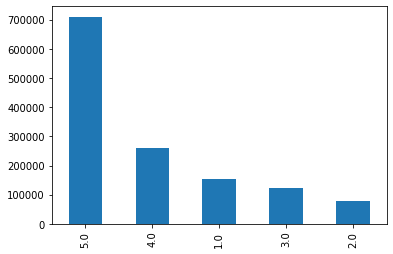

In [6]:
df.rating.value_counts().plot(kind='bar')
plt.show()

In [7]:
df.isnull().sum()

user         0
item         0
rating       0
timestamp    0
dtype: int64

In [12]:
from surprise import Reader, Dataset
reader = Reader()
data = Dataset.load_from_df(df[['user', 'item', 'rating']], reader)

In [13]:
from surprise.model_selection import train_test_split
trainset, testset = train_test_split(data, test_size=0.25)

In [14]:
from surprise import SVD, accuracy
algo = SVD()
algo.fit(trainset)

In [16]:
predictions = algo.test(testset)

In [17]:
accuracy.rmse(predictions)

RMSE: 1.2562


1.2562415787042327

## Restart

In [18]:
from surprise import Reader
from surprise import Dataset
from surprise.model_selection import cross_validate
from surprise import NormalPredictor
from surprise import KNNBasic
from surprise import KNNWithMeans
from surprise import KNNWithZScore
from surprise import KNNBaseline
from surprise import SVD
from surprise import BaselineOnly
from surprise import SVDpp
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise.accuracy import rmse
from surprise import accuracy
from surprise.model_selection import train_test_split

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1324753 entries, 0 to 1324752
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   user       1324753 non-null  object 
 1   item       1324753 non-null  object 
 2   rating     1324753 non-null  float64
 3   timestamp  1324753 non-null  int64  
dtypes: float64(1), int64(1), object(2)
memory usage: 40.4+ MB


In [9]:
print('Dataset shape: {}'.format(df.shape))
print('-Dataset examples-')
print(df.iloc[::200000, :])

Dataset shape: (1324753, 4)
-Dataset examples-
                   user        item  rating   timestamp
0         AB9S9279OZ3QO  0078764343     5.0  1373155200
200000   A1UI9KTM8UYJ3A  B0001O10V8     4.0  1383696000
400000   A2SM2URVICWRMN  B000R0SS3Y     4.0  1220659200
600000    AGQWS1LIW9L1O  B0025KZV7A     5.0  1305936000
800000    AMOOFTKUJQRDQ  B003S2SQFS     5.0  1294531200
1000000  A25FYZAJ2ITLSN  B005QWYKOE     3.0  1324598400
1200000  A238JB46G90KFU  B00BUQA14I     5.0  1390521600


In [10]:
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

data = df['rating'].value_counts().sort_index(ascending=False)
trace = go.Bar(x = data.index,
               text = ['{:.1f} %'.format(val) for val in (data.values / df.shape[0] * 100)],
               textposition = 'auto',
               textfont = dict(color = '#000000'),
               y = data.values,
               )
# Create layout
layout = dict(title = 'Distribution Of {} video-game-ratings'.format(df.shape[0]),
              xaxis = dict(title = 'Rating'),
              yaxis = dict(title = 'Count'))
# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

In [11]:
# Number of ratings per book
data = df.groupby('item')['rating'].count().clip(upper=50)

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'ratings',
                     xbins = dict(start = 0,
                                  end = 50,
                                  size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings Per Video Game (Clipped at 50)',
                   xaxis = dict(title = 'Number of Ratings Per Video Game'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

In [12]:
df.groupby('item')['rating'].count().reset_index().sort_values('rating', ascending=False)[:10]

,item,rating
47005,B00DJFIMW6,16221
45409,B00BGA9WK2,7561
47906,B00FAX6XQC,5713
43795,B009KS4XRO,5489
31038,B002VBWIP6,5190
38490,B0055SWM08,4638
46509,B00CSR2J9I,4510
23744,B0015AARJI,4468
24153,B00178630A,3522
17419,B000FKBCX4,3290


In [13]:
# Number of ratings per user
data = df.groupby('user')['rating'].count().clip(upper=50)

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'Ratings',
                     xbins = dict(start = 0,
                                  end = 50,
                                  size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings Per User (Clipped at 50)',
                   xaxis = dict(title = 'Ratings Per User'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

In [14]:
df.groupby('user')['rating'].count().reset_index().sort_values('rating', ascending=False)[:10]

,user,rating
626277,A3V6Z4RCDGRC44,880
631894,A3W4D8XOGLWUN5,817
727161,AJKWF4W7QD4NS,797
380195,A2QHS1ZCIQOL7E,521
397465,A2TCG2HV1VJP6V,474
275663,A29BQ6B90Y1R5F,429
704245,AFV2584U13XP3,338
221297,A20DZX38KRBIT8,320
651622,A74TA8X5YQ7NE,267
250887,A2582KMXLK2P06,263


In [15]:
min_vgame_ratings = 8
filter_games = df['item'].value_counts() > min_vgame_ratings
filter_games = filter_games[filter_games].index.tolist()

min_user_ratings = 8
filter_users = df['user'].value_counts() > min_user_ratings
filter_users = filter_users[filter_users].index.tolist()

df_new = df[(df['item'].isin(filter_games)) & (df['user'].isin(filter_users))]
print('The original data frame shape:\t{}'.format(df.shape))
print('The new data frame shape:\t{}'.format(df_new.shape))

The original data frame shape:	(1324753, 4)
The new data frame shape:	(158312, 4)


In [17]:
# Creating a sparse pivot table with users in rows and items in columns
users_items_matrix_df = df_new.pivot(index   = 'user', 
                                 columns = 'item', 
                                 values  = 'rating').fillna(0)
users_items_matrix_df.head(10)

item,0700026657,0700099867,3828770193,3866811659,6050036071,7100027950,7293000936,7293000960,7543450933,8176503290,...,B00JJYTICE,B00JM3R6M6,B00JQ8YH6A,B00JQHU9RC,B00JTJF8K0,B00JXW6GE0,B00JYE8L9K,B00KAI3KW2,B00KHECZXO,B00L2Q5KWE
user,,,,,,,,,,,,,,,,,,,,,
A005481137I9SCAWEF7ON,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A0266076X6KPZ6CCHGVS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A049511737EMTVGTZXNKV,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A066010017AGU5GEHA7TJ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A08324222HTYZDE4L3F8Z,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1006LIQ9Z6QN3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A100JCBNALJFAW,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A100STMN7BADN9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A100Y9BI0I69B8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
users_items_matrix_df.shape

(9875, 16844)

In [19]:
# very sprase matrix
users_items_matrix_df.values.mean()*100

0.38616883448713285

In [20]:
from keras.optimizers import Adam
from keras.layers import Input, Dense, Dropout
from keras.models import Model


def autoEncoder(X):
    '''
    Autoencoder for Collaborative Filter Model
    '''

    # Input, take the raw interaction matrix
    input_layer = Input(shape=(X.shape[1],), name='UserScore')
    
    # Encoder
    # -----------------------------
    enc = Dense(512, activation='selu', name='EncLayer1')(input_layer)

    # Latent Space
    # -----------------------------
    lat_space = Dense(256, activation='selu', name='LatentSpace')(enc)
    lat_space = Dropout(0.8, name='Dropout')(lat_space) # regularization term

    # Decoder
    # -----------------------------
    dec = Dense(512, activation='selu', name='DecLayer1')(lat_space)

    # Output
    output_layer = Dense(X.shape[1], activation='linear', name='UserScorePred')(dec) 
    # the output target is continus score, therefore the activation is linear

    # this model maps an input to its reconstruction
    model = Model(input_layer, output_layer)    
    
    return model

Using TensorFlow backend.


In [21]:
# input
X = users_items_matrix_df.values
y = users_items_matrix_df.values

In [22]:
# Build model
model = autoEncoder(X)

model.compile(optimizer = Adam(lr=0.0001), loss='mse')
    
model.summary()



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
UserScore (InputLayer)       (None, 16844)             0         
_________________________________________________________________
EncLayer1 (Dense)            (None, 512)               8624640   
_________________________________________________________________
LatentSpace (Dense)          (None, 256)               131328    
_________________________________________________________________
Dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
DecLayer1 (Dense)            (None, 512)               131584    
____________________________________________________________

In [ ]:
hist = model.fit(x=X, y=y,
                  epochs=20,
                  batch_size=64,
                  shuffle=True,
                  validation_split=0.25)




Train on 7406 samples, validate on 2469 samples
Epoch 1/20







In [31]:
reader = Reader(rating_scale=(0, 4))
data = Dataset.load_from_df(df_new[['user', 'item', 'rating']], reader)

In [32]:
benchmark = []
# Iterate over all algorithms
for algorithm in [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), KNNBasic(), KNNWithMeans(), KNNWithZScore(), BaselineOnly(), CoClustering()]:
    # Perform cross validation
    results = cross_validate(algorithm, data, measures=['RMSE'], cv=3, verbose=False)
    
    # Get results & append algorithm name
    tmp = pd.DataFrame.from_dict(results).mean(axis=0)
    tmp = tmp.append(pd.Series([str(algorithm).split(' ')[0].split('.')[-1]], index=['Algorithm']))
    benchmark.append(tmp)

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...


In [33]:
surprise_results = pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')

In [34]:
surprise_results

,test_rmse,fit_time,test_time
Algorithm,,,
SVDpp,1.123240,42.185305,2.885501
SVD,1.127719,5.977569,0.394029
BaselineOnly,1.133043,0.449814,0.242358
KNNBaseline,1.188007,3.640436,2.545821
CoClustering,1.188030,4.068205,0.569393
KNNWithMeans,1.190234,3.308606,1.980949
KNNWithZScore,1.201393,3.315243,3.009313
KNNBasic,1.236255,3.086396,2.472603
SlopeOne,1.244033,8.830373,1.678310


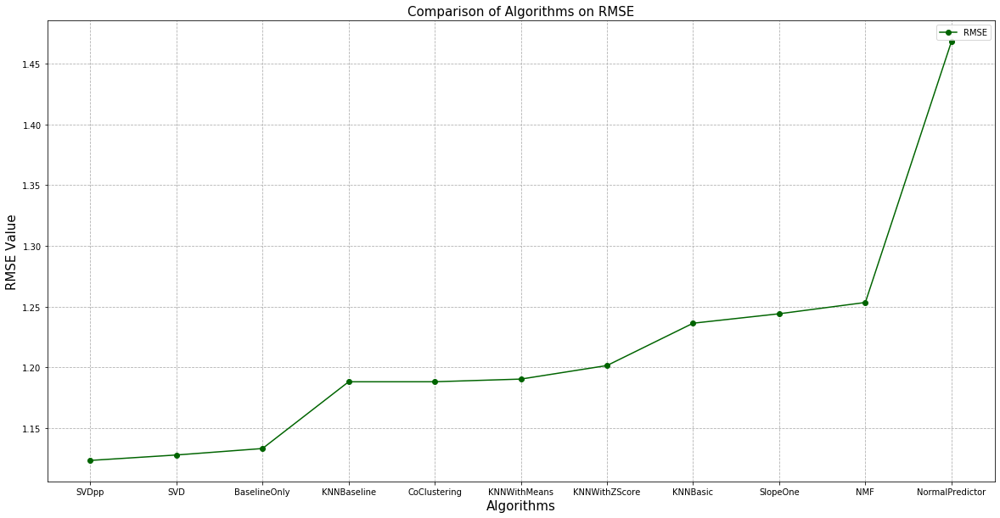

In [36]:
x_algo = ['SVDpp', 'SVD', 'BaselineOnly', 'KNNBaseline', 'CoClustering', 'KNNWithMeans', 'KNNWithZScore', 'KNNBasic', 'SlopeOne', 'NMF', 'NormalPredictor']
rmse_cv = surprise_results.test_rmse

plt.figure(figsize=(20,10))

plt.title('Comparison of Algorithms on RMSE', loc='center', fontsize=15)
plt.plot(x_algo, rmse_cv, label='RMSE', color='darkgreen', marker='o')
plt.xlabel('Algorithms', fontsize=15)
plt.ylabel('RMSE Value', fontsize=15)
plt.legend()
plt.grid(ls='dashed')

plt.show()

## Best models happened to be SVDpp, SVD, and KNNs

In [42]:
trainset, testset = train_test_split(data, test_size=0.25)

In [45]:
#Perform GridSearch CV on top three algorithms - SVDpp, SVD and KNN
#Let’s try tweaking parameters on SVDpp, SVD using GridSearchCV
from surprise.model_selection import cross_validate
from surprise.model_selection import GridSearchCV
# Parameter space
svd_param_grid = {'n_epochs': [25, 30], 
                  'lr_all': [0.005, 0.01],
                  'reg_all': [0.2, 0.4]}

svdpp_gs = GridSearchCV(SVDpp, svd_param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
svdpp_gs.fit(data)

svd_gs = GridSearchCV(SVD, svd_param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
svd_gs.fit(data)

In [46]:
print('SVDpp - RMSE:', round(svdpp_gs.best_score['rmse'], 4), '; MAE:', round(svdpp_gs.best_score['mae'], 4))
print('SVD   - RMSE:', round(svd_gs.best_score['rmse'], 4), '; MAE:', round(svd_gs.best_score['mae'], 4))

SVDpp - RMSE: 1.1144 ; MAE: 0.9182
SVD   - RMSE: 1.114 ; MAE: 0.9173


In [47]:
print('RMSE =', svdpp_gs.best_params['rmse'])
print('MAE =', svdpp_gs.best_params['mae'])

RMSE = {'n_epochs': 25, 'lr_all': 0.01, 'reg_all': 0.2}
MAE = {'n_epochs': 30, 'lr_all': 0.005, 'reg_all': 0.2}


In [48]:
print('RMSE =', svd_gs.best_params['rmse'])
print('MAE =', svd_gs.best_params['mae'])

RMSE = {'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.2}
MAE = {'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.2}


In [52]:
param_grid = {'k': [15, 20, 50, 100, 200, 500]}

knnbasic_gs = GridSearchCV(KNNBasic, param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
knnbasic_gs.fit(data)

knnmeans_gs = GridSearchCV(KNNWithMeans, param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
knnmeans_gs.fit(data)

knnz_gs = GridSearchCV(KNNWithZScore, param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
knnz_gs.fit(data)

In [53]:
x = [15, 20, 50, 100, 200, 500]
y1 = knnbasic_gs.cv_results['mean_test_rmse']
y2 = knnbasic_gs.cv_results['mean_test_mae']

y3 = knnmeans_gs.cv_results['mean_test_rmse']
y4 = knnmeans_gs.cv_results['mean_test_mae']

y5 = knnz_gs.cv_results['mean_test_rmse']
y6 = knnz_gs.cv_results['mean_test_mae']

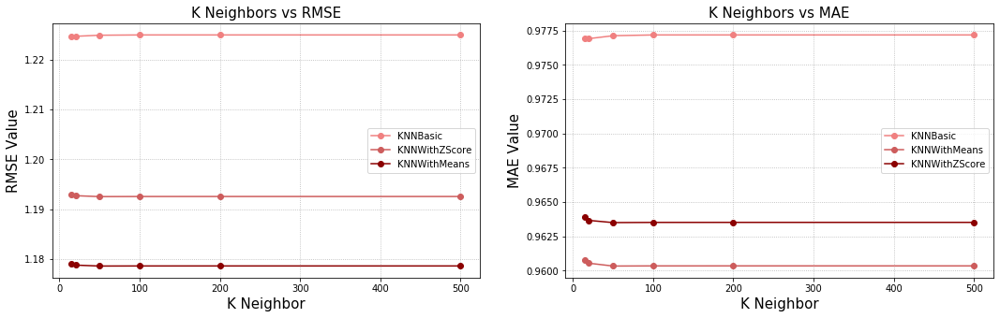

In [54]:
plt.figure(figsize=(18,5))

plt.subplot(1, 2, 1)
plt.title('K Neighbors vs RMSE', loc='center', fontsize=15)
plt.plot(x, y1, label='KNNBasic', color='lightcoral', marker='o')
plt.plot(x, y5, label='KNNWithZScore', color='indianred', marker='o')
plt.plot(x, y3, label='KNNWithMeans', color='darkred', marker='o')
plt.xlabel('K Neighbor', fontsize=15)
plt.ylabel('RMSE Value', fontsize=15)
plt.legend()
plt.grid(ls='dotted')

plt.subplot(1, 2, 2)
plt.title('K Neighbors vs MAE', loc='center', fontsize=15)
plt.plot(x, y2, label='KNNBasic', color='lightcoral', marker='o')
plt.plot(x, y4, label='KNNWithMeans', color='indianred', marker='o')
plt.plot(x, y6, label='KNNWithZScore', color='darkred', marker='o')
plt.xlabel('K Neighbor', fontsize=15)
plt.ylabel('MAE Value', fontsize=15)
plt.legend()
plt.grid(ls='dotted')

plt.show()

In [55]:
SVDpp_val = SVDpp(lr_all=0.01, n_epochs=25, reg_all=0.2)
predictions = SVDpp_val.fit(trainset).test(testset)
accuracy.rmse(predictions)

RMSE: 1.1114


1.1114265929838572

In [56]:
trainset = SVDpp_val.trainset
print(SVDpp_val.__class__.__name__)

SVDpp


In [57]:
def get_Iu(uid):
    """ return the number of items rated by given user
    args: 
      uid: the id of the user
    returns: 
      the number of items rated by the user
    """
    try:
        return len(trainset.ur[trainset.to_inner_uid(uid)])
    except ValueError: # user was not part of the trainset
        return 0
    
def get_Ui(iid):
    """ return number of users that have rated given item
    args:
      iid: the raw id of the item
    returns:
      the number of users that have rated the item.
    """
    try: 
        return len(trainset.ir[trainset.to_inner_iid(iid)])
    except ValueError:
        return 0
    
inspect = pd.DataFrame(predictions, columns=['uid', 'iid', 'rui', 'est', 'details'])
inspect['Iu'] = inspect.uid.apply(get_Iu)
inspect['Ui'] = inspect.iid.apply(get_Ui)
inspect['err'] = abs(inspect.est - inspect.rui)

In [58]:
best_predictions = inspect.sort_values(by='err')[:10]
worst_predictions = inspect.sort_values(by='err')[-10:]

In [59]:
best_predictions

,uid,iid,rui,est,details,Iu,Ui,err
16160,A3UV7L5ND3EH8T,B000O5HY46,4.0,4.0,{'was_impossible': False},14,5,0.0
15707,A1K0L2PKZLISWJ,B0002W5S0I,4.0,4.0,{'was_impossible': False},5,5,0.0
15709,A3UDQ2ZT470SOW,B0053BCO00,4.0,4.0,{'was_impossible': False},52,66,0.0
34317,AI7WXHDA2OJXH,B000E0VMVM,4.0,4.0,{'was_impossible': False},10,10,0.0
15710,A30IP5D5DLHRPA,B00D6PTMSW,4.0,4.0,{'was_impossible': False},38,22,0.0
34321,A55TVW2SE2JXK,B00006HBTW,4.0,4.0,{'was_impossible': False},10,26,0.0
26051,A2M12RUFO2HZGV,B00CMQTVUA,4.0,4.0,{'was_impossible': False},7,102,0.0
26050,A1MAQ2ZS6N50QJ,B0016NRS8M,4.0,4.0,{'was_impossible': False},12,21,0.0
34329,A1ALD09SAYLVYI,B000KI99ZE,4.0,4.0,{'was_impossible': False},40,8,0.0
34331,A3IS23397LB45,B00000DMAP,4.0,4.0,{'was_impossible': False},17,2,0.0


In [60]:
worst_predictions

,uid,iid,rui,est,details,Iu,Ui,err
22067,A1MHB1HRR6VPEH,B00DBCAS7E,5.0,1.943930,{'was_impossible': False},91,2,3.056070
24683,A27EBTIQEO2XGC,B0091UOGFU,5.0,1.824917,{'was_impossible': False},10,1,3.175083
30251,A1X4MUEESKQ91Z,B00CF7KVGE,5.0,1.821762,{'was_impossible': False},6,11,3.178238
21006,A3U0M0456YPLT1,B000KIF890,5.0,1.821386,{'was_impossible': False},5,5,3.178614
30368,A10YSK7RS1OIJ0,B0043B5SKE,5.0,1.728994,{'was_impossible': False},7,9,3.271006
37178,A33YHYE1QJ47K8,B00D4WTO1M,5.0,1.696251,{'was_impossible': False},15,64,3.303749
27187,A378UD8TSIECG9,B00503E8S2,5.0,1.665310,{'was_impossible': False},13,157,3.334690
26576,A3CPJYAQMCUGNR,B00BU7WVG8,5.0,1.639454,{'was_impossible': False},10,5,3.360546
1466,A22UVUVV8E0L6C,B000G0HJ3K,5.0,1.463123,{'was_impossible': False},6,24,3.536877
17294,A21GTH20R33D6B,B00BRQP27M,5.0,1.462853,{'was_impossible': False},151,4,3.537147


In [61]:
df_new.loc[df_new['item'] == 'B00BRQP27M']['rating'].describe()

count    5.00000
mean     2.60000
std      2.19089
min      1.00000
25%      1.00000
50%      1.00000
75%      5.00000
max      5.00000
Name: rating, dtype: float64

<IPython.core.display.Javascript object>


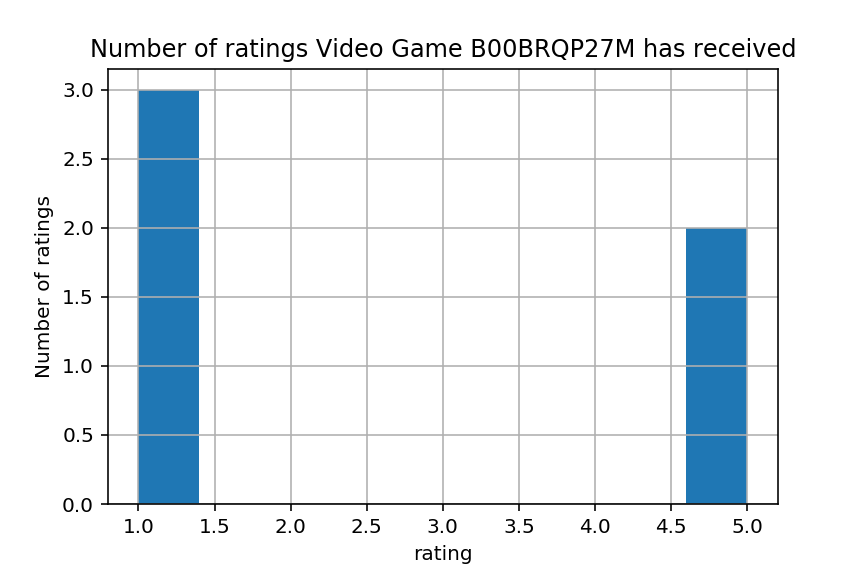

In [63]:
import matplotlib.pyplot as plt
%matplotlib notebook

df_new.loc[df_new['item'] == 'B00BRQP27M']['rating'].hist()
plt.xlabel('rating')
plt.ylabel('Number of ratings')
plt.title('Number of ratings Video Game B00BRQP27M has received')
plt.show();

In [6]:
reviews = pd.read_json('reviews_Video_Games_5.json', lines=True)
reviews.head(10)

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2HD75EMZR8QLN,0700099867,123,"[8, 12]",Installing the game was a struggle (because of...,1,Pay to unlock content? I don't think so.,1341792000,"07 9, 2012"
1,A3UR8NLLY1ZHCX,0700099867,"Alejandro Henao ""Electronic Junky""","[0, 0]",If you like rally cars get this game you will ...,4,Good rally game,1372550400,"06 30, 2013"
2,A1INA0F5CWW3J4,0700099867,"Amazon Shopper ""Mr.Repsol""","[0, 0]",1st shipment received a book instead of the ga...,1,Wrong key,1403913600,"06 28, 2014"
3,A1DLMTOTHQ4AST,0700099867,ampgreen,"[7, 10]","I got this version instead of the PS3 version,...",3,"awesome game, if it did not crash frequently !!",1315958400,"09 14, 2011"
4,A361M14PU2GUEG,0700099867,"Angry Ryan ""Ryan A. Forrest""","[2, 2]",I had Dirt 2 on Xbox 360 and it was an okay ga...,4,DIRT 3,1308009600,"06 14, 2011"
5,A2UTRVO4FDCBH6,0700099867,A.R.G.,"[0, 0]","Overall this is a well done racing game, with ...",4,"Good racing game, terrible Windows Live Requir...",1368230400,"05 11, 2013"
6,AN3YYDZAS3O1Y,0700099867,Bob,"[11, 13]",Loved playing Dirt 2 and I thought the graphic...,5,A step up from Dirt 2 and that is terrific!,1313280000,"08 14, 2011"
7,AQTC623NCESZW,0700099867,Chesty Puller,"[1, 4]",I can't tell you what a piece of dog**** this ...,1,Crash 3 is correct name AKA Microsoft,1353715200,"11 24, 2012"
8,A1QJJU33VNC4S7,0700099867,D@rkFX,"[0, 1]",I initially gave this one star because it was ...,4,A great game ruined by Microsoft's account man...,1352851200,"11 14, 2012"
9,A2JLT2WY0F2HVI,0700099867,D. Sweetapple,"[1, 1]",I still haven't figured this one out. Did ever...,2,Couldn't get this one to work,1391817600,"02 8, 2014"
